In [226]:
import pandas as pd
import numpy as np
import os
import sys

#https://www.kaggle.com/jeffd23/the-nature-conservancy-fisheries-monitoring/deep-learning-in-the-deep-blue-lb-1-279
#https://www.kaggle.com/narae78/the-nature-conservancy-fisheries-monitoring/fish-detection
#https://www.kaggle.com/andrelopes1705/the-nature-conservancy-fisheries-monitoring/lasagne-based-of-zfturbo-keras-code/code
#https://www.youtube.com/watch?v=qIUh3CEeTqg
#https://medium.com/@ageitgey/machine-learning-is-fun-part-3-deep-learning-and-convolutional-neural-networks-f40359318721#.f8uh9jgiu
#http://blog.xebia.fr/2017/03/01/tensorflow-deep-learning-episode-1-introduction/
#http://cs231n.github.io/neural-networks-3/

In [227]:
TRAIN_PATH = './data/train'

In [228]:
def listFiles():
    map_dir_files = {}
    for d in os.listdir(TRAIN_PATH):
        d = os.path.join(TRAIN_PATH,d)
        if os.path.isdir(d):
            files = os.listdir(d)
            map_dir_files [d] = files
            sys.stderr.writelines("Nb files for %s: %d \n" % (d, len(files)))
    return map_dir_files

In [229]:
%time map_dir_files = listFiles()

Nb files for ./data/train\ALB: 1719 
Nb files for ./data/train\BET: 200 
Nb files for ./data/train\DOL: 117 
Nb files for ./data/train\LAG: 67 
Nb files for ./data/train\NoF: 465 


Wall time: 440 ms


Nb files for ./data/train\OTHER: 299 
Nb files for ./data/train\SHARK: 176 
Nb files for ./data/train\YFT: 734 


In [230]:
from PIL import Image
import matplotlib.pyplot as plt
import random
%matplotlib inline

In [231]:
def plot_graph(fish, nbfiles, nbcolumns, is_random = True):
    files = os.listdir(fish)
    nblines = int(nbfiles / nbcolumns)
    fig, ax = plt.subplots(nrows=nblines, ncols=nbcolumns, figsize=(15,15))
    ax = ax.flatten()
   
    for i in range(0,nbfiles):
        f = random.choice(files) if is_random else files[i]
        img = Image.open(os.path.join(fish,f))
        ax[i].imshow(img)
        ax[i].set_xticks([])
        ax[i].set_yticks([])
        ax[i].set_title("%s h:%s w:%s" % (f, img.height,img.width))
    plt.tight_layout()

Wall time: 6.71 s


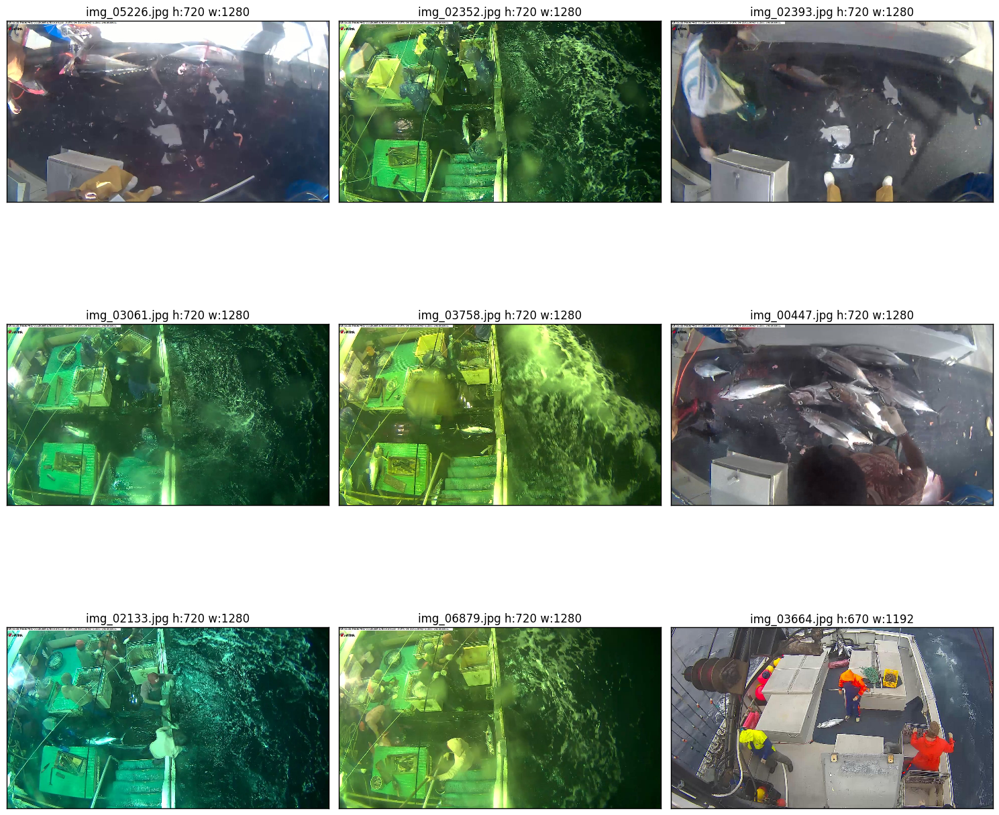

In [232]:
%time plot_graph(os.path.join(TRAIN_PATH,'ALB'), 9, 3 )

Wall time: 2.69 s


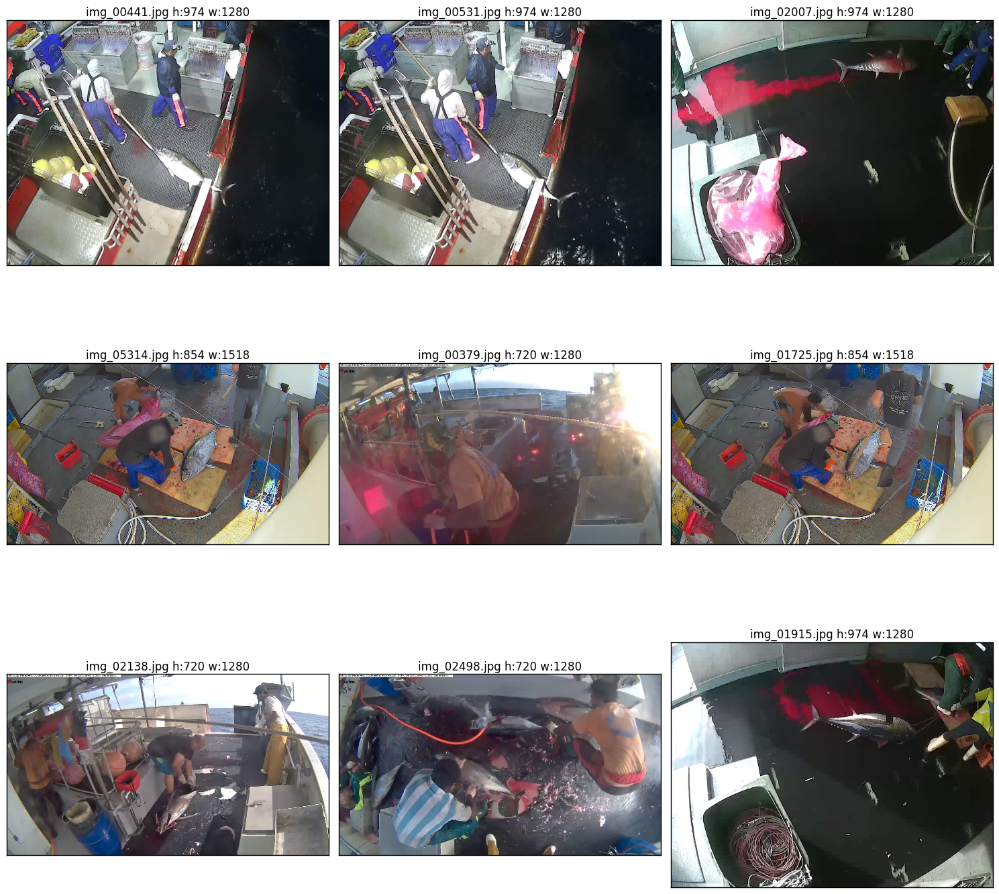

In [233]:
%time plot_graph(os.path.join(TRAIN_PATH,'BET'), 9, 3 )

Wall time: 2.63 s


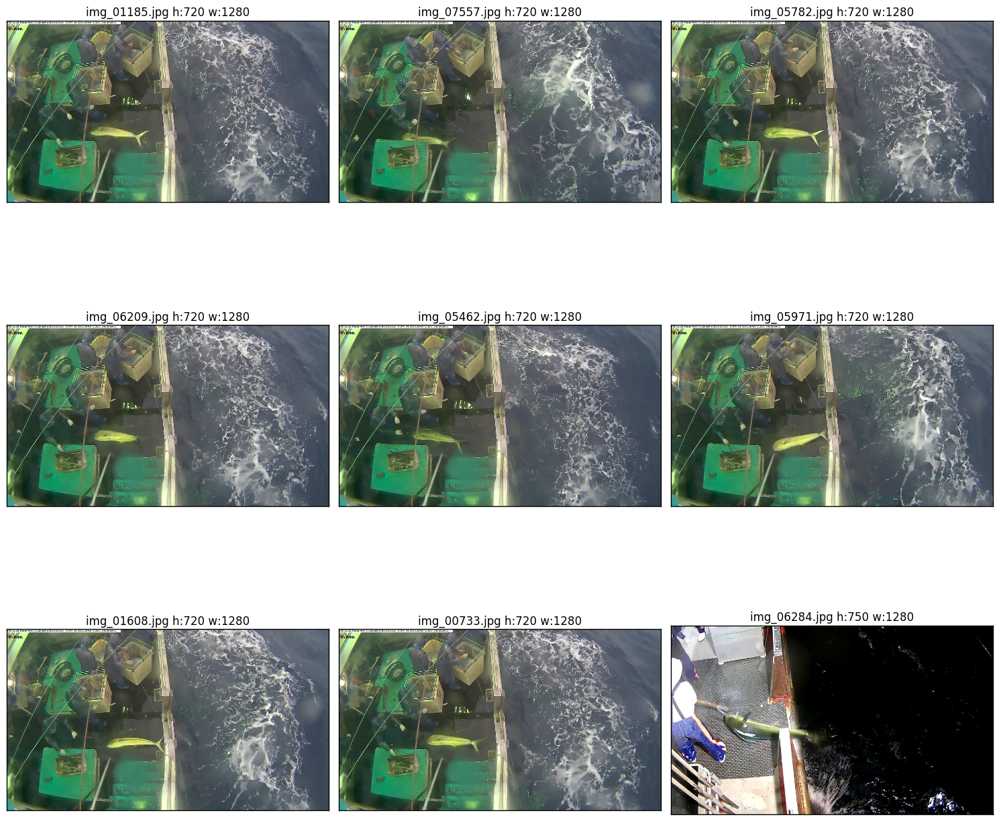

In [234]:
%time plot_graph(os.path.join(TRAIN_PATH,'DOL'), 9, 3 )

Wall time: 2.43 s


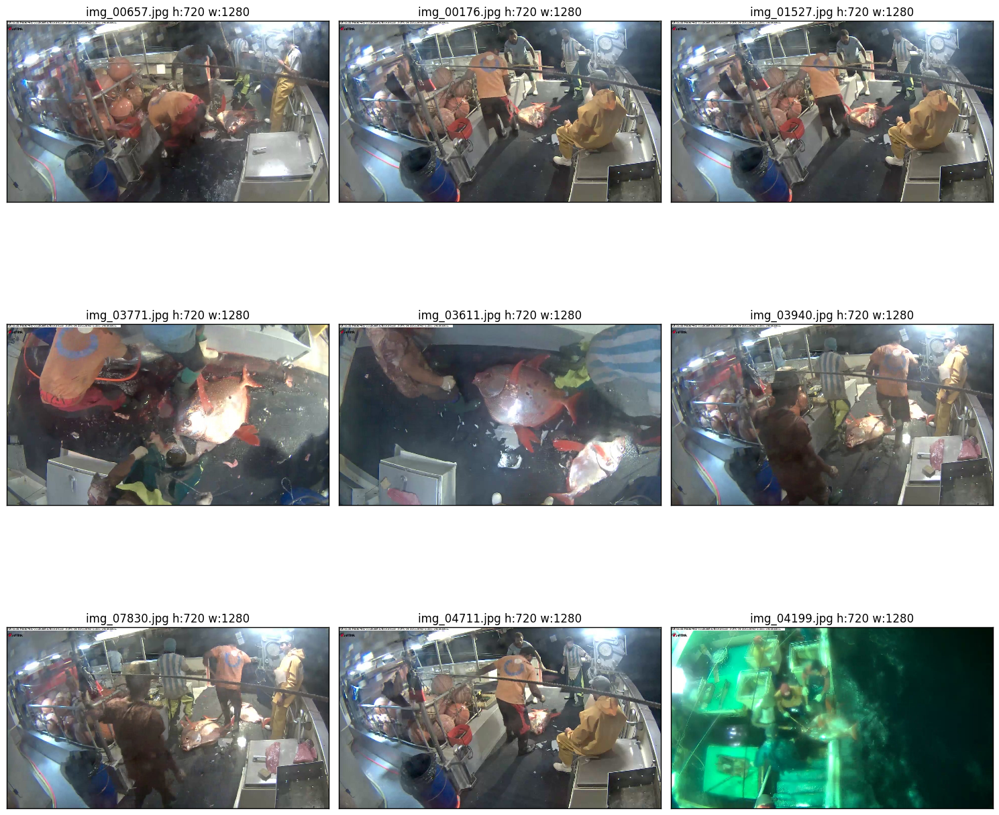

In [235]:
%time plot_graph(os.path.join(TRAIN_PATH,'LAG'), 9, 3 )

Wall time: 1.66 s


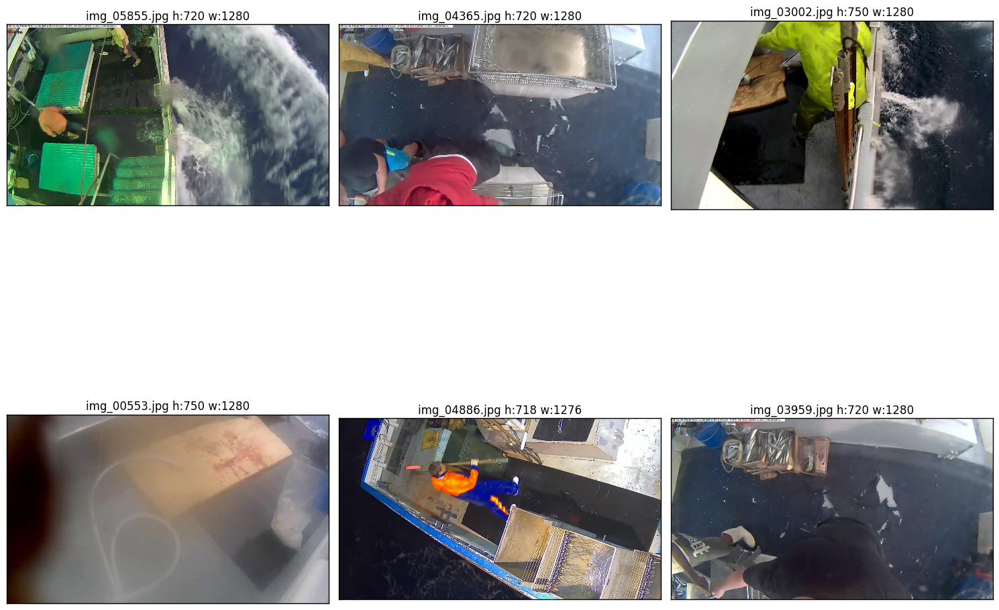

In [236]:
%time plot_graph(os.path.join(TRAIN_PATH,'Nof'),6, 3 )

In [237]:
def get_all_files(root_dir):
    list_files = []
    for root, subdirs, files in os.walk(root_dir):
            list_files.extend([os.path.join(root,f) for f in files])
    return list_files

In [238]:
%time list_files = get_all_files(TRAIN_PATH)
list_files[:10]

Wall time: 588 ms


['./data/train\\ALB\\img_00003.jpg',
 './data/train\\ALB\\img_00010.jpg',
 './data/train\\ALB\\img_00012.jpg',
 './data/train\\ALB\\img_00015.jpg',
 './data/train\\ALB\\img_00019.jpg',
 './data/train\\ALB\\img_00020.jpg',
 './data/train\\ALB\\img_00029.jpg',
 './data/train\\ALB\\img_00032.jpg',
 './data/train\\ALB\\img_00037.jpg',
 './data/train\\ALB\\img_00038.jpg']

In [239]:
np_files = np.array(list_files)
%time shapes = [Image.open(f).size for f in list_files]

Wall time: 1min 41s


In [240]:
import pandas as pd

In [241]:
pd.Series(shapes).value_counts()

(1280, 720)    2174
(1280, 750)     598
(1280, 974)     395
(1276, 718)     220
(1192, 670)     198
(1280, 924)      60
(1518, 854)      39
(1732, 974)      35
(1334, 750)      31
(1244, 700)      27
dtype: int64

## Data split

In [242]:
#conda install -c https://conda.binstar.org/menpo opencv3
import cv2
print (cv2.__version__)
print (cv2.__file__)

3.1.0
C:\Users\el_ma_000\Anaconda3_5\lib\site-packages\cv2.cp35-win_amd64.pyd


In [243]:
N_COLS = 128
N_ROWS = 128

In [244]:
def build_X_y(files, COLS = 160, ROWS = 90,  CHANNELS =3):
    X = np.ndarray((len(files), ROWS, COLS, CHANNELS), dtype = np.float32)
    y = []
    
    for i,im in enumerate(files):
        fish = str.split(os.path.dirname(im), os.sep)[-1]
        if i%500 == 0:
            sys.stderr.writelines("file:%s y:%s  %d/%d \n" % (im.title(), fish, i ,len(files)))
            sys.stderr.flush()
        
        im = cv2.imread(im,cv2.IMREAD_COLOR)
        X[i] = cv2.resize(im, (COLS,ROWS), interpolation=cv2.INTER_CUBIC)
        y.append(fish)
    return X,y

In [245]:
%time X,y = build_X_y(list_files, COLS = N_COLS, ROWS = N_ROWS)

file:./Data/Train\Alb\Img_00003.Jpg y:ALB  0/3777 
file:./Data/Train\Alb\Img_02263.Jpg y:ALB  500/3777 
file:./Data/Train\Alb\Img_04683.Jpg y:ALB  1000/3777 
file:./Data/Train\Alb\Img_07078.Jpg y:ALB  1500/3777 
file:./Data/Train\Dol\Img_05446.Jpg y:DOL  2000/3777 
file:./Data/Train\Nof\Img_06610.Jpg y:NoF  2500/3777 
file:./Data/Train\Shark\Img_06082.Jpg y:SHARK  3000/3777 
file:./Data/Train\Yft\Img_04918.Jpg y:YFT  3500/3777 


Wall time: 4min 52s


In [246]:
FOLDER_RESIZED = 'RESIZED'
if not os.path.exists(FOLDER_RESIZED):
    os.mkdir(FOLDER_RESIZED)

In [247]:
for i in range(12):
    im = random.choice(X)
    im_name = os.path.join(FOLDER_RESIZED,"im_%s.jpg" % i)
    %time cv2.imwrite(im_name, im)

Wall time: 594 ms
Wall time: 62.5 ms
Wall time: 30.6 ms
Wall time: 31.4 ms
Wall time: 31.3 ms
Wall time: 45.8 ms
Wall time: 24 ms
Wall time: 17 ms
Wall time: 20 ms
Wall time: 12 ms
Wall time: 20 ms
Wall time: 17.7 ms


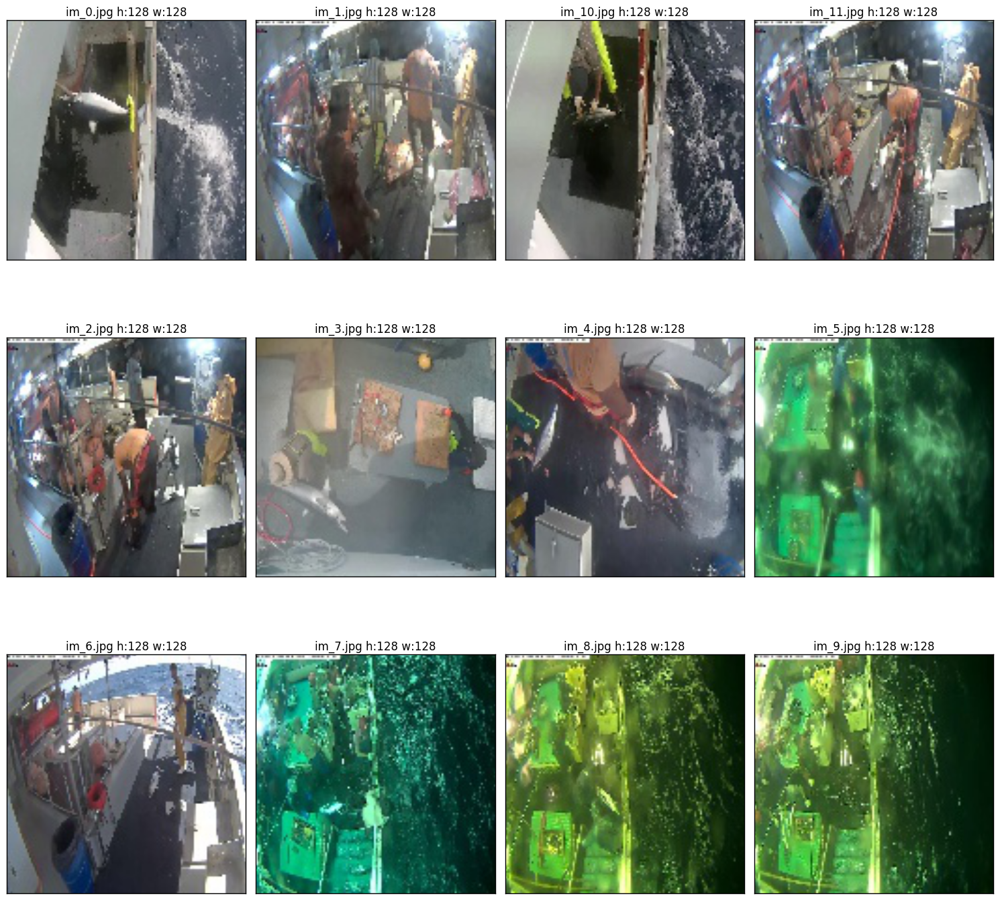

In [248]:
plot_graph(FOLDER_RESIZED,12,4,is_random = False)

In [249]:
from sklearn.cross_validation import train_test_split

In [250]:
%time X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.7, random_state=42, stratify=y)

Wall time: 12.3 s


In [251]:
sys.stderr.writelines('Nb values: %d \n' % len(y_train))

alb_ratio_train = np.count_nonzero(np.asarray(y_train) == 'ALB') / len(y_train)
sys.stderr.writelines('Ratio ALB in train: %f \n' % alb_ratio_train)

alb_ratio_test = np.count_nonzero(np.asarray(y_test) == 'ALB') / len(y_test)
sys.stderr.writelines('Ratio ALB in test: %f \n' % alb_ratio_test)

dol_ratio_train = np.count_nonzero(np.asarray(y_train) == 'DOL') / len(y_train)
sys.stderr.writelines('Ratio DOL in train: %f \n' % dol_ratio_train)

dol_ratio_test = np.count_nonzero(np.asarray(y_test) == 'DOL') / len(y_test)
sys.stderr.writelines('Ratio DOL in test: %f \n' % dol_ratio_test)

Nb values: 1133 
Ratio ALB in train: 0.455428 
Ratio ALB in test: 0.454992 
Ratio DOL in train: 0.030891 
Ratio DOL in test: 0.031014 


In [252]:
shapes = [x.shape for x in X]
pd.Series(shapes).value_counts()

(128, 128, 3)    3777
dtype: int64

In [253]:
from sklearn import preprocessing

In [254]:
lbl_encoder = preprocessing.LabelEncoder()

In [255]:
y_train_encoded = lbl_encoder.fit_transform(y_train)
y_train_encoded

array([7, 0, 7, ..., 0, 0, 4], dtype=int64)

In [256]:
y_test_encoded = lbl_encoder.transform(y_test)
y_test_encoded

array([4, 0, 4, ..., 0, 5, 0], dtype=int64)


## Tensor Flow

In [257]:
#conda install -c conda-forge tensorflow
import tensorflow as tf
from tensorflow.contrib import learn
from tensorflow.contrib.learn.python.learn.estimators import model_fn as model_fn_lib

In [258]:
N_OUTPUT= 8

## Build Estimator

https://www.tensorflow.org/extend/estimators
https://www.tensorflow.org/tutorials/layers#evaluate_the_model

In [259]:
def cnn_model(X, output, mode):

    ## Input
    X = tf.reshape(X, [-1, 128, 128, 3])
    
    ## 1st Convolutional Layer
    conv1 = tf.layers.conv2d(
        inputs = X,
        filters = 64,
        kernel_size = [5,5],
        padding = 'same',    
        use_bias = True,
        kernel_initializer = None,
        bias_initializer = None,
        activation = tf.nn.relu,
        name='conv1'
    )
    
    ## 1st Pooling layer
    pool1 = tf.layers.max_pooling2d(
        inputs = conv1,
        pool_size=[2,2],
        strides=[2,2],
        name='pool1'
    )
    
    ## 2nd convolutional layer
    conv2 = tf.layers.conv2d(
        inputs = pool1,
        filters = 128,
        kernel_size =[5,5],
        padding='same',
        use_bias=True,kernel_initializer = None,
        bias_initializer = None,
        activation=tf.nn.relu,
        name='conv2'
    )
    
    
    ## 2nd Pooling layer 
    pool2 = tf.layers.max_pooling2d(
        inputs=conv2, 
        pool_size=[2,2],
        strides=[2,2],
        name='pool2'
    )
    
    ## Densely connected layer
    pool2_flat = tf.reshape(pool2,  [-1, 32 * 32 * 128], name='pool2_flat')
    
    dense = tf.layers.dense(
        inputs=pool2_flat,
        units=1024,
        activation=tf.nn.relu,
        name='dense'
    )
  
    
    ## Dropout layer
    dropout=tf.layers.dropout(
        inputs = dense,
        rate = 0.4, #dropout_rate
        training = mode == learn.ModeKeys.TRAIN,
        name='dropout'
    )
    
    ## Logits
    logits = tf.layers.dense(
        inputs = dropout,
        units = 8,
        name='logits'
    )
    
    loss = None
    train_op = None
    
    #Calculate loss for TRAIN and EVAL
    if mode != learn.ModeKeys.INFER:
        onehot_labels = tf.one_hot(
            indices = output,
            depth = 8
        )
        
        loss = tf.losses.softmax_cross_entropy(
            onehot_labels = onehot_labels,
            logits = logits
        ) 
    
    #summaries
    if mode != learn.ModeKeys.INFER:
        summaries = [tf.summary.image("input_pictures", X, max_outputs=20),
                     tf.summary.scalar("cross_entropy", tf.reduce_mean(loss))]
    
    #training mode
    if mode == learn.ModeKeys.TRAIN:
        train_op = tf.contrib.layers.optimize_loss(
            loss = loss,
            global_step = tf.contrib.framework.get_global_step(),
            learning_rate = 0.0001,
            optimizer ='SGD',
            name ='train_op',
            summaries = summaries
        )
    
    #Generate predictions
    class_predictions =  tf.arg_max(
        input = logits,
        dimension = 1,
        name='classes_tensor'
    )
    
    class_probas =  tf.nn.softmax(
        logits = logits,
        name='softmax_tensor'
    )
    
    predictions = {
        'classes' : class_predictions,
        'probabilities' : class_probas
    }
    
    #Generate metrics
    accuracy = tf.metrics.accuracy(output, class_predictions)
    rmse = tf.metrics.root_mean_squared_error(output, class_predictions)
    
    eval_metrics_ops = {
        'accuracy' : accuracy,
        'rmse' : rmse
    }
        
    #Return a modelfnOps
    return model_fn_lib.ModelFnOps(
        mode = mode,
        predictions = predictions,
        loss = loss,
        train_op = train_op,
        eval_metric_ops = eval_metrics_ops
    )

In [260]:
LOG_FOLDER = os.path.join(os.getcwd(), 'logs')
if not os.path.exists(LOG_FOLDER):
    os.mkdir(LOG_FOLDER)

In [261]:
LEARNING_RATE = 0.0001
model_params = {'learning_rate' : LEARNING_RATE}

In [262]:
classifier = learn.Estimator(
    model_fn = cnn_model, 
    model_dir = LOG_FOLDER,
    params = None
)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_tf_random_seed': None, '_is_chief': True, '_save_checkpoints_steps': None, '_environment': 'local', '_save_checkpoints_secs': 600, '_keep_checkpoint_every_n_hours': 10000, '_master': '', '_save_summary_steps': 100, '_tf_config': gpu_options {
  per_process_gpu_memory_fraction: 1
}
, '_evaluation_master': '', '_num_ps_replicas': 0, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000000C1E9E19400>, '_task_id': 0, '_keep_checkpoint_max': 5, '_task_type': None}


In [263]:
from tensorflow.contrib.learn.python import SKCompat

In [264]:
classifier = SKCompat(classifier)
classifier

SKCompat()

In [ ]:
#Logging
tensors_to_log = {'probabilities' : 'softmax_tensor', 'classes' : 'classes_tensor'}
logging_hook = tf.train.LoggingTensorHook(
    tensors = tensors_to_log,
    every_n_iter = 1
)

#http://git.hiddenunit.com/hakan/tersorflow/commit/9a863139a335084ad167e1daf02bbf35ba5b2b88

In [ ]:
#Classifier
%time classifier.fit(x = X_train, y = y_train_encoded, batch_size = 100, monitors = [logging_hook], max_steps = 1000)

INFO:tensorflow:Create CheckpointSaverHook.


In [ ]:
#Prediciton
#%time evalutations = classifier.evaluate(x = X_test, y = y_test_encoded, metrics=metrics)
%time evalutations = classifier.score(x = X_train, y = y_train_encoded)
print(evalutations)

https://www.amazon.co.uk/d/cka/Hands-Machine-Learning-Scikit-Learn-Tensorflow-Techniques-Intelligent/1491962291/ref=sr_1_1?ie=UTF8&qid=1490900368&sr=8-1&keywords=Hands-On+Machine+Learning+with+Scikit-Learn+and+TensorFlow%3A

In [ ]:
#http://deeplearning.lipingyang.org/tensorflow-examples1/
#http://stackoverflow.com/questions/tagged/tensorboard?sort=votes&pageSize=50

In [ ]:
TEST_PATH = './data/test'

In [ ]:
files = get_all_files(TEST_PATH)
files

In [ ]:
X_pred, _ = build_X_y(files, COLS=N_COLS, ROWS=N_ROWS)
X_pred.shape

In [ ]:
%time pred = classifier.predict(x = X_pred)
pred

In [ ]:
output_proba = pred['probabilities']
output_proba

In [ ]:
df = pd.read_csv('./data/sample_submission_stg1.csv/sample_submission_stg1.csv')
df

In [ ]:
df.loc[: , ['ALB','BET', 'DOL','LAG', 'NoF', 'OTHER','SHARK','YFT']] = output_proba
df

In [ ]:
df.to_csv('./output/pred.csv', index=False)